In [2]:
import sys
import os
from time import time

sys.path.append("../../../../src/")
import numpy as np
import numpy.linalg as la
from itertools import combinations
from scipy.linalg import toeplitz
from collections import Counter  
from matplotlib.pyplot import plot
import matplotlib.pyplot as plt
import kblock_ising_model as kb

from scipy.integrate import solve_ivp

#Compare to other method



#Imports
import single_particle_sector as sps
import numpy as np
import scipy as sp
import numpy.linalg as la
import matplotlib.pyplot as plt
from matplotlib.pyplot import plot, scatter


In [4]:
##Time Evolution Stuff
def h_linear(t,tau,h0,hf):
    return h0-(h0-hf)*(t/tau)
# Define RHS
def TFIM_time_evolve(N_steps,tau, h0,hf, J, L, U0= None, bc = "ABC"):

    def rhs(t, U_flat, h_t, tau, h0, hf, J,bc):
        h = hf
        H = sps.H_bdg(h,L,J)
        U = U_flat.reshape(2*L,2*L)
        dUdt = -1j*2*H@U
        return dUdt.flatten()
    #ABSOLUTELY NECESSARY STEP
   # print(type(U0))
    U0 = U0.astype(np.complex128) 
    #solver stuff 
    args = (sps.h_t,tau,h0,hf,J,bc)
    t_grid = np.linspace(0,tau,N_steps)
    sol = solve_ivp(rhs, [0, tau], U0.flatten(), args=args, t_eval=t_grid, method="RK45", vectorized=False, dtype=np.complex128)
    
    
    U_t = np.array([sol.y[:, i].reshape(2*L, 2*L) for i in range(len(sol.t))])
    #print(sol.message)
    return U_t

/Users/kristianmunnikhuis/miniconda3/envs/TFIM/lib/python3.11/site-packages/scipy/integrate/_ivp/ivp.py:621: UserWarning: The following arguments have no effect for a chosen solver: `dtype`.
  solver = method(fun, t0, y0, tf, vectorized=vectorized, **options)
/Users/kristianmunnikhuis/Research Projects/subsystem_loschmidt_echo/scripts/mutual_info/exact_diag/Integrable Ising Model/../../../../src/single_particle_sector.py:281: RuntimeWarning: divide by zero encountered in matmul
  dUdt = -1j*2*H@U
/Users/kristianmunnikhuis/Research Projects/subsystem_loschmidt_echo/scripts/mutual_info/exact_diag/Integrable Ising Model/../../../../src/single_particle_sector.py:281: RuntimeWarning: overflow encountered in matmul
  dUdt = -1j*2*H@U
/Users/kristianmunnikhuis/Research Projects/subsystem_loschmidt_echo/scripts/mutual_info/exact_diag/Integrable Ising Model/../../../../src/single_particle_sector.py:281: RuntimeWarning: invalid value encountered in matmul
  dUdt = -1j*2*H@U
/var/folders/tb/9nr_h

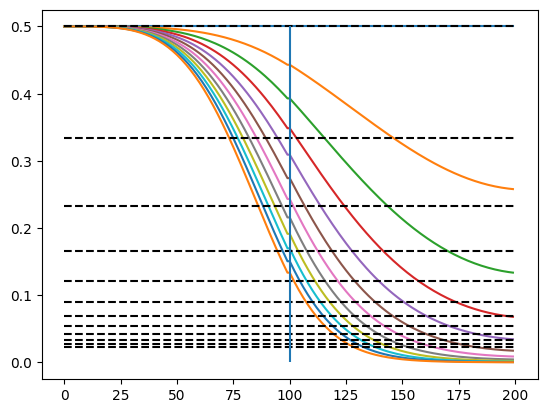

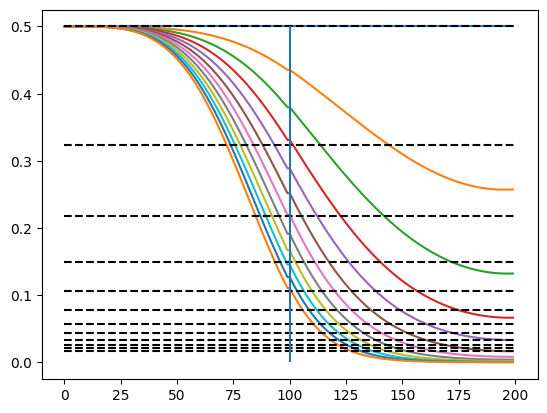

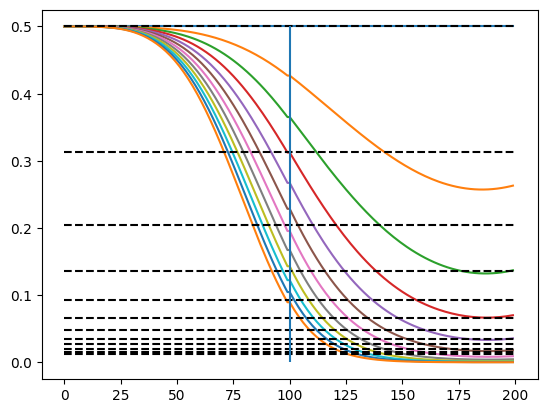

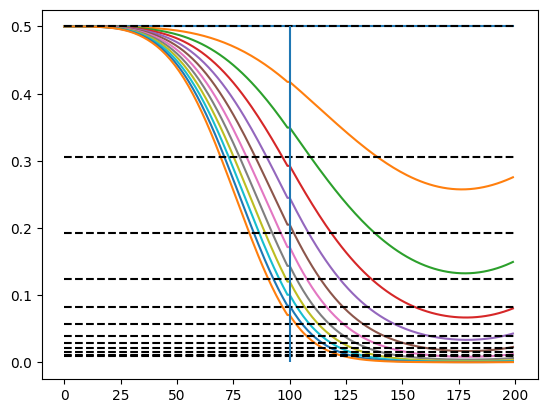

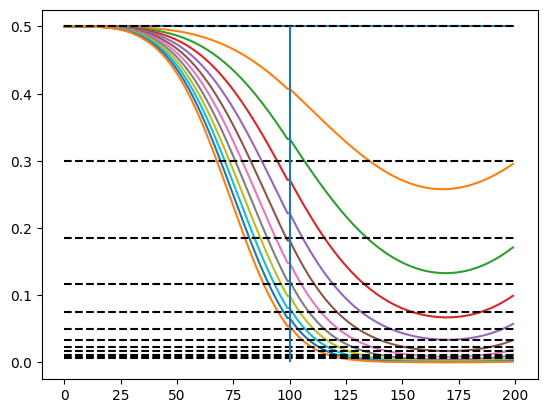

...

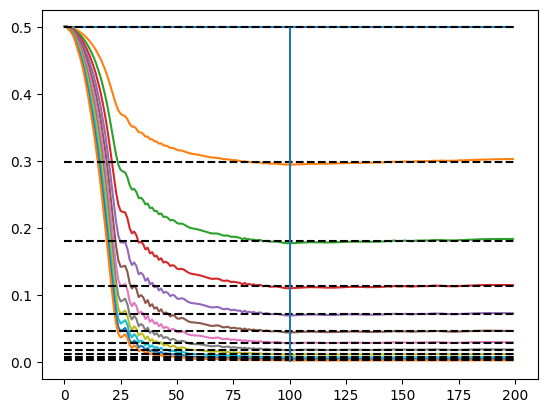

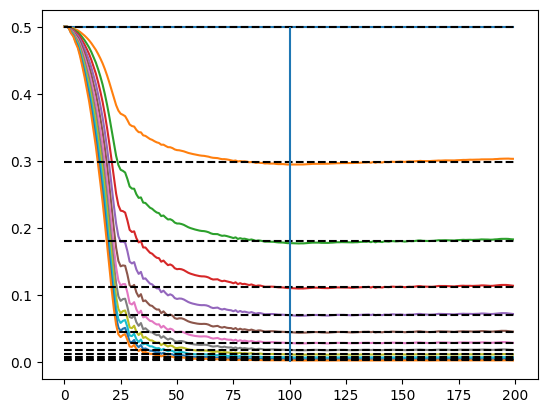

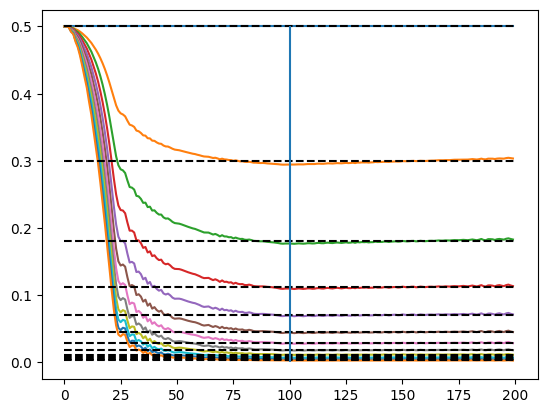

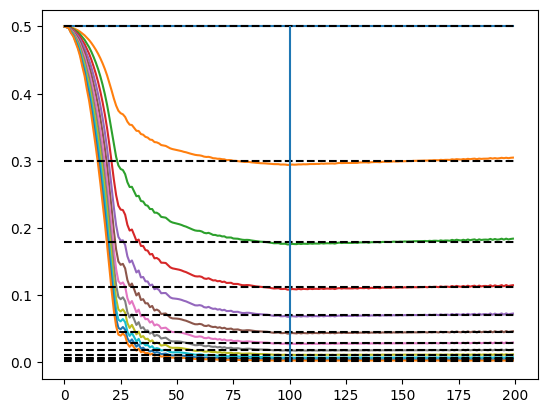

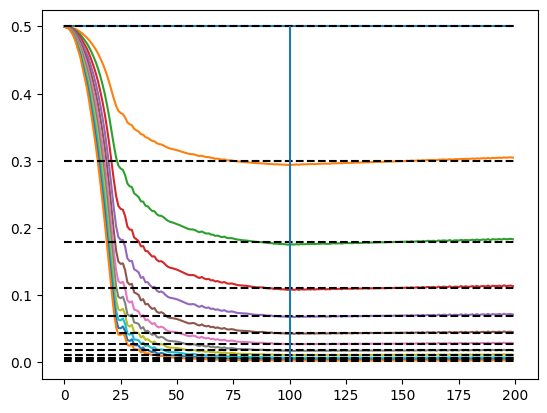

In [56]:
#Model Parameters
N_steps = 100
avg_n = 12
L = 200
h0 = 0
hf = 5
J = 1.0
parity=True


#Tau Range
taus = np.logspace(-1,2,100)
P_bgs_tau = []
for tau in taus:
    #Evolve in time from 0 to tau
    U_test   = sps.TFIM_time_evolve(N_steps,tau, h0,hf, J, L, U0= None, bc = "ABC")
    #Evolve in final hamiltonian to time average over oscillations
    U_time_avg = TFIM_time_evolve(N_steps,tau, hf,hf, J,L, U0= U_test[-1], bc = "ABC")
    #Create Empty Matrix of <P_n>
    P_BGS_t = np.empty([avg_n,2*N_steps])
    #Create Correlation Matrices
    G_test = [sps.G_tfim(U_test[i][:,L:]) for i in range(0,N_steps)]
    G = G_test+ [sps.G_tfim(U_time_avg[i][:,L:]) for  i in range(0,N_steps)]
    #Calculate <P_n(t)>
    for n in range(1,avg_n+1):
        for ti in range(2*N_steps):
            Gi = G[ti]
            P_BGS_t[n-1,ti]= sps.P_n(n,Gi,L,parity)
    #Plot Figure to show averaging
    plt.figure()
    plot(P_BGS_t.T)

    plt.hlines(np.mean(P_BGS_t[:,N_steps:], axis=1),0,len(G),colors="black",linestyles="--")
    plt.vlines(N_steps,0,0.5)
    P_bgs_tau.append(P_BGS_t)


In [57]:
#Final Ground State
Uf = sps.TFIM_time_evolve(N_steps//4,tau//4, hf,h0, J, L, U0= None, bc = "ABC")[0]

#Calculate Final <Pn>
G = sps.G_tfim(Uf[:,L:])

P_gs_final = np.array([sps.P_n(i,G,L) for i in range(1,avg_n+1)])

Final_Delta_time_avg = []
for i in range(0,np.shape(P_bgs_tau)[0]):
     Xi = P_bgs_tau[i][:,N_steps:].T-P_gs_final
     Final_Delta_time_avg+= [np.mean(Xi,axis=0)]




THIS IS HOW THEY GET SAVED

In [64]:
#np.savetxt("Final_Delta_time_avg.txt",Final_Delta_time_avg,delimiter=",")
X = np.array(P_bgs_tau)
np.save("P_TAU.txt",X)

Text(0, 0.5, 'Δ(τ)')

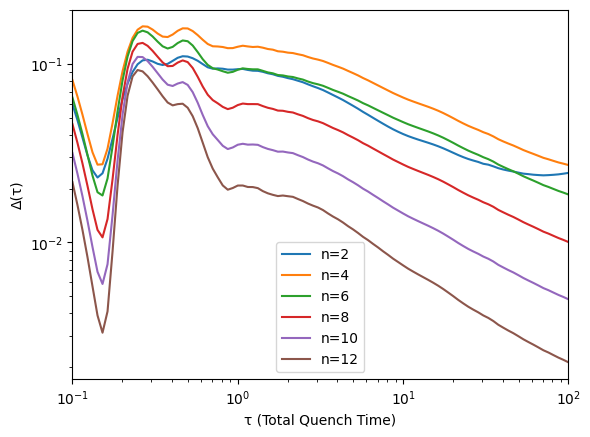

In [65]:
Final_Delta_time_avg = np.array(Final_Delta_time_avg)
plot(taus,Final_Delta_time_avg[:,1::2],label= [f"n={i}" for i in range(1+1,avg_n+1,2)])
#plot(taus,taus**(-1/2)*A,color="Black", linestyle="--")
plt.legend()
plt.xlim(taus[0],taus[-1])
plt.xscale("log")
plt.yscale("log")
plt.xlabel(f"τ (Total Quench Time)")
plt.ylabel(f"Δ(τ)")
#plt.ylim(0.001,.17)


In [132]:
#Final Ground State
Uf = sps.TFIM_time_evolve(N_steps//4,tau//4, hf,h0, J, L, U0= None, bc = "ABC")[0]

#Calculate Final <Pn>
G = sps.G_tfim(Uf[:,L:])

P_gs_final = np.array([sps.P_n(i,G,L) for i in range(1,avg_n+1)])

Prob_proportion = []
for i in range(0,np.shape(P_bgs_tau)[0]):
    Xi = np.mean(P_bgs_tau[i][:,N_steps:].T,axis=0)
    Prob_proportion += [Xi]


Prob_proportion = np.array(Prob_proportion)


Text(0.5, 0, 'τ (Total Quench Time)')

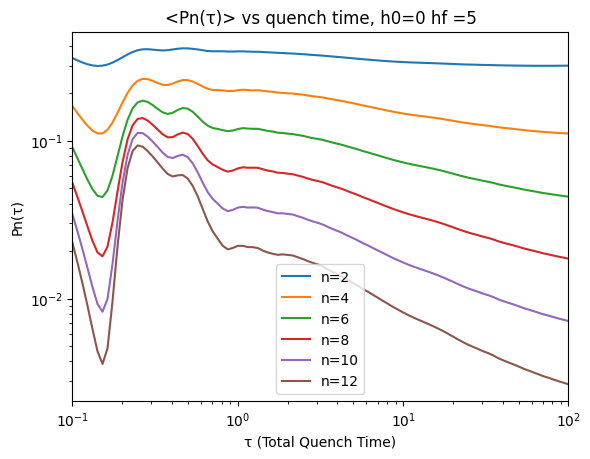

In [133]:
plt.loglog(taus,Prob_proportion[:,1::2],label= [f"n={i}" for i in range(1+1,avg_n+1,2)])
plt.xlim(taus[0],taus[-1])
plt.legend()
plt.title(f"<Pn(τ)> vs quench time, h0={h0} hf ={hf}")
plt.ylabel(f"Pn(τ)")
plt.xlabel(f"τ (Total Quench Time)")

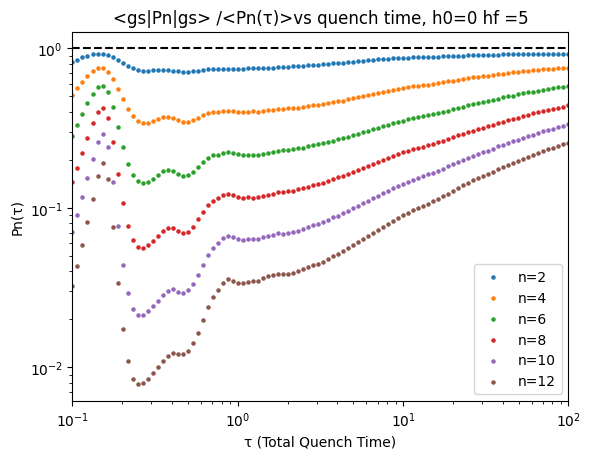

In [157]:
Prob_proportion = np.array(Prob_proportion)

labels = [f"n={i}" for i in range(1+1, avg_n+1, 2)]

for i, label in enumerate(labels):
    plt.scatter(taus, P_gs_final[1+2*i]/Prob_proportion[:, 1 + 2*i], label=label,s=5)
    #plt.scatter(taus, Prob_proportion[:, 1 + 2*i], s=5)

plt.xlim(taus[0], taus[-1])
plt.legend()
plt.title(f"<gs|Pn|gs> /<Pn(τ)>vs quench time, h0={h0} hf ={hf}")
plt.ylabel("Pn(τ)")
plt.xlabel("τ (Total Quench Time)")
plt.hlines(1,taus[0],taus[-1],linestyle="--",colors="black")
plt.yscale("log")
plt.xscale("log")

Text(0.5, 0, 'τ (Total Quench Time)')

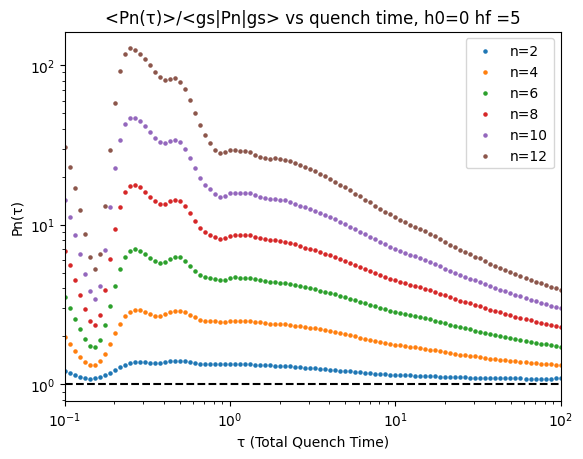

In [156]:

Prob_proportion = np.array(Prob_proportion)

labels = [f"n={i}" for i in range(1+1, avg_n+1, 2)]

for i, label in enumerate(labels):
    plt.scatter(taus, Prob_proportion[:, 1 + 2*i]/P_gs_final[1+2*i], label=label,s=5)
    #plt.scatter(taus, Prob_proportion[:, 1 + 2*i], s=5)
plt.hlines(1,taus[0],taus[-1],linestyle="--",colors="black")
plt.xlim(taus[0], taus[-1])
plt.yscale("log")
plt.xscale("log")
plt.legend()
plt.title(f"<Pn(τ)>/<gs|Pn|gs> vs quench time, h0={h0} hf ={hf}")
plt.ylabel("Pn(τ)")
plt.xlabel("τ (Total Quench Time)")
